<a href="https://colab.research.google.com/github/Steven2110/CelestialDistancePredict-Model/blob/main/DS_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Regression analysis for predicting Redshift in Galaxy
This is a university project for "Introduction to Data Science". In this project we are using regression analysis for predicting the redshift value of a galaxy. 
- Data Source: [Sload Digital Sky Survey DR 16](https://www.kaggle.com/datasets/muhakabartay/sloan-digital-sky-survey-dr16?resource=download)

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
df = pd.read_csv("/content/drive/MyDrive/DS_Project/Skyserver_12_30_2019 4_49_58 PM.csv")

In [5]:
df.head()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1237666301628060000,47.372545,0.820621,18.69254,17.13867,16.55555,16.34662,16.17639,4849,301,5,771,8168632633242440000,STAR,0.000115,7255,56597,832
1,1237673706652430000,116.303083,42.455980,18.47633,17.30546,17.24116,17.32780,17.37114,6573,301,6,220,9333948945297330000,STAR,-0.000093,8290,57364,868
2,1237671126974140000,172.756623,-8.785698,16.47714,15.31072,15.55971,15.72207,15.82471,5973,301,1,13,3221211255238850000,STAR,0.000165,2861,54583,42
3,1237665441518260000,201.224207,28.771290,18.63561,16.88346,16.09825,15.70987,15.43491,4649,301,3,121,2254061292459420000,GALAXY,0.058155,2002,53471,35
4,1237665441522840000,212.817222,26.625225,18.88325,17.87948,17.47037,17.17441,17.05235,4649,301,3,191,2390305906828010000,GALAXY,0.072210,2123,53793,74


In [6]:
df.shape

(100000, 18)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   objid      100000 non-null  int64  
 1   ra         100000 non-null  float64
 2   dec        100000 non-null  float64
 3   u          100000 non-null  float64
 4   g          100000 non-null  float64
 5   r          100000 non-null  float64
 6   i          100000 non-null  float64
 7   z          100000 non-null  float64
 8   run        100000 non-null  int64  
 9   rerun      100000 non-null  int64  
 10  camcol     100000 non-null  int64  
 11  field      100000 non-null  int64  
 12  specobjid  100000 non-null  uint64 
 13  class      100000 non-null  object 
 14  redshift   100000 non-null  float64
 15  plate      100000 non-null  int64  
 16  mjd        100000 non-null  int64  
 17  fiberid    100000 non-null  int64  
dtypes: float64(8), int64(8), object(1), uint64(1)
memory usage: 13.7+

1. 1 категориальный признак
2. 8 признаков являются непрерывным
3. 8 признаков являются целочисленным

In [8]:
df.describe().round(2)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.000000e+05,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.00,100000.0,100000.00,100000.00,1.000000e+05,100000.00,100000.00,100000.00,100000.00
mean,1.237663e+18,177.51,25.05,18.64,17.41,16.88,16.63,16.47,3978.73,301.0,3.27,187.24,2.913905e+18,0.17,2587.98,53913.91,341.70
std,7.264931e+12,78.04,20.57,0.83,0.99,1.13,1.21,1.28,1691.50,0.0,1.62,141.04,2.488872e+18,0.44,2210.55,1547.24,217.07
min,1.237646e+18,0.01,-19.50,10.61,9.67,9.01,8.85,8.95,109.00,301.0,1.00,11.00,2.994897e+17,-0.00,266.00,51608.00,1.00
25%,1.237658e+18,136.36,6.77,18.21,16.85,16.20,15.87,15.62,2826.00,301.0,2.00,85.00,1.335426e+18,0.00,1186.00,52733.00,160.00
50%,1.237662e+18,180.41,23.92,18.87,17.52,16.89,16.60,16.43,3900.00,301.0,3.00,153.00,2.354330e+18,0.05,2091.00,53726.00,328.00
75%,1.237667e+18,224.37,40.34,19.27,18.06,17.59,17.34,17.23,5061.00,301.0,5.00,249.00,3.276384e+18,0.10,2910.00,54585.00,502.00
max,1.237681e+18,360.00,84.49,19.60,20.00,31.99,32.14,29.38,8162.00,301.0,6.00,982.00,1.317645e+19,7.01,11703.00,58543.00,1000.00


In [9]:
df.isna().sum()

objid        0
ra           0
dec          0
u            0
g            0
r            0
i            0
z            0
run          0
rerun        0
camcol       0
field        0
specobjid    0
class        0
redshift     0
plate        0
mjd          0
fiberid      0
dtype: int64

In [11]:
correlation = df.corr()
correlation.style.background_gradient(cmap='coolwarm')

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
objid,1.000000,-0.064351,-0.055489,0.010553,0.018754,0.020594,0.024751,0.027222,1.000000,nan,0.001595,-0.164873,0.366206,0.025678,0.366206,0.414232,0.095430
ra,-0.064351,1.000000,0.076869,0.020903,0.017404,0.012410,0.006191,0.001267,-0.064350,nan,-0.007632,0.021964,-0.056831,-0.006616,-0.056830,-0.030444,-0.027535
dec,-0.055489,0.076869,1.000000,-0.027315,-0.013263,-0.004657,-0.001074,0.004785,-0.055499,nan,0.081407,-0.113244,0.017817,0.011340,0.017817,0.026241,0.029428
u,0.010553,0.020903,-0.027315,1.000000,0.843252,0.692903,0.615987,0.562021,0.010552,nan,0.006705,0.012013,0.008705,0.172663,0.008705,-0.011243,0.017322
g,0.018754,0.017404,-0.013263,0.843252,1.000000,0.956717,0.915003,0.886663,0.018753,nan,0.011895,0.007629,0.147623,0.422311,0.147622,0.114511,0.068937
r,0.020594,0.012410,-0.004657,0.692903,0.956717,1.000000,0.976051,0.961456,0.020593,nan,0.013450,0.002214,0.203246,0.453376,0.203246,0.171312,0.085876
i,0.024751,0.006191,-0.001074,0.615987,0.915003,0.976051,1.000000,0.977189,0.024749,nan,0.015305,-0.001310,0.236314,0.449680,0.236314,0.207153,0.093089
z,0.027222,0.001267,0.004785,0.562021,0.886663,0.961456,0.977189,1.000000,0.027220,nan,0.013702,-0.003809,0.251838,0.440964,0.251837,0.226435,0.096774
run,1.000000,-0.064350,-0.055499,0.010552,0.018753,0.020593,0.024749,0.027220,1.000000,nan,0.001476,-0.164865,0.366204,0.025678,0.366205,0.414230,0.095397
rerun,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


## Pandas profiling для создания отчёта

In [12]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 46.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 74.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=64fff5478fc33fefae3f22fe150dc907794b8e56587470645a7ce3e6af593b0d
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

In [13]:
from pandas_profiling import ProfileReport

In [14]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Divide data into features and target

In [10]:
target = df['redshift']
target

0        0.000115
1       -0.000093
2        0.000165
3        0.058155
4        0.072210
           ...   
99995    0.438182
99996   -0.000497
99997    0.004587
99998    0.084538
99999   -0.000085
Name: redshift, Length: 100000, dtype: float64

In [11]:
features = pd.DataFrame()
# We need to divide all the flux magnitude into 4 separate color from these magnitudes:
#  - Color u-g: u magnitude - g magnitude
#  - Color g-r: g magnitude - r magnitude
#  - Color r-i: r magnitude - i magnitude
#  - Color i-z: i magnitude - z magnitude
features["ug"] = df["u"] - df["g"]
features["gr"] = df["g"] - df["r"]
features["ri"] = df["r"] - df["i"]
features["iz"] = df["i"] - df["z"]
features

,ug,gr,ri,iz
0,1.55387,0.58312,0.20893,0.17023
1,1.17087,0.06430,-0.08664,-0.04334
2,1.16642,-0.24899,-0.16236,-0.10264
3,1.75215,0.78521,0.38838,0.27496
4,1.00377,0.40911,0.29596,0.12206
...,...,...,...,...
99995,0.49883,0.17089,0.05178,-0.00436
99996,1.03322,0.14328,0.01142,0.00476
99997,1.87538,0.40824,0.17859,-0.24199
99998,2.12510,0.91739,0.42952,0.35189


## Подключение библиотек

In [12]:
!pip install -U sklearn-rvm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
from numpy import mean
from numpy import std

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn_rvm import EMRVR
from sklearn.svm import SVR

from sklearn.metrics import roc_auc_score, mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from sklearn.model_selection import cross_val_score

## Divide features and target data into train and test data

In [14]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.5, random_state=144)

In [15]:
# Feature selection by ExtraTreesRegressor(model based)

from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as acc

In [16]:
reg= ExtraTreesRegressor()

In [17]:
reg.fit(X_train,y_train)

# Let us print the features importance.
reg.feature_importances_

array([0.58441271, 0.16118187, 0.12240419, 0.13200123])

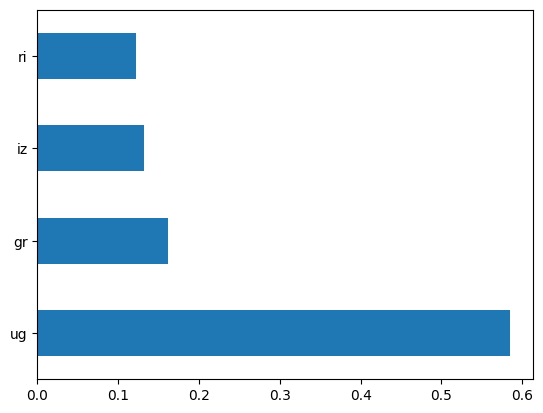

In [18]:
feat_importances = pd.Series(reg.feature_importances_, index=X_train.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

In [19]:
dtr = DecisionTreeRegressor()

In [20]:
dtr.fit(X_train, y_train)

score = dtr.score(X_train, y_train)

# Prediction on the training dataset
y_train_pred = dtr.predict(X_train)

mse = mean_squared_error(y_train, y_train_pred)
mae = mean_absolute_error(y_train, y_train_pred)
evs = explained_variance_score(y_train, y_train_pred)

print(f"R-squared: {score}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")

R-squared: 1.0
Mean Absolute Error: 0.0
Mean Squared Error: 0.0
RMSE: 0.0
EVS: 1.0


### Evaluation
For mean squared error we need to get value closer to 0

For RMSE (Root Mean Squared Error) value needs to be lower than 0.5 (<0.5)

In [21]:
y_pred = dtr.predict(X_test)

rScore = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")

R-squared: 0.535686336410052
Mean Absolute Error: 0.06
Mean Squared Error: 0.09
RMSE: 0.01
EVS: 0.54


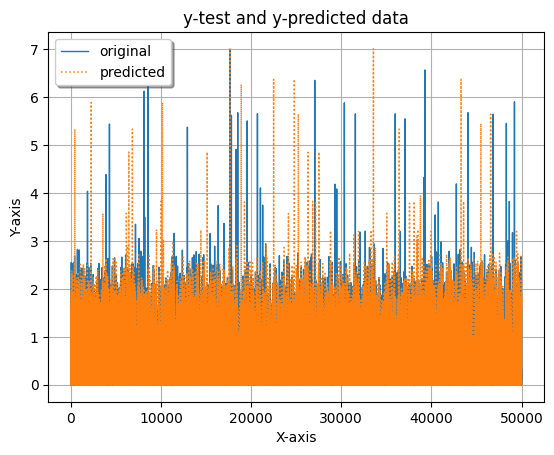

In [22]:
x_ax = range(len(y_test))
fig = plt.figure()
plt.plot(x_ax, y_test, linewidth=1, label="original", linestyle='-')
plt.plot(x_ax, y_pred, linewidth=1.1, label="predicted", linestyle=':')
plt.title("y-test and y-predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
# plt

In [23]:
print(f"Min redshift: {df['redshift'].min()}, max redshift: {df['redshift'].max()}")

Min redshift: -0.004136078, max redshift: 7.011245


In [24]:
data = y_test-y_pred

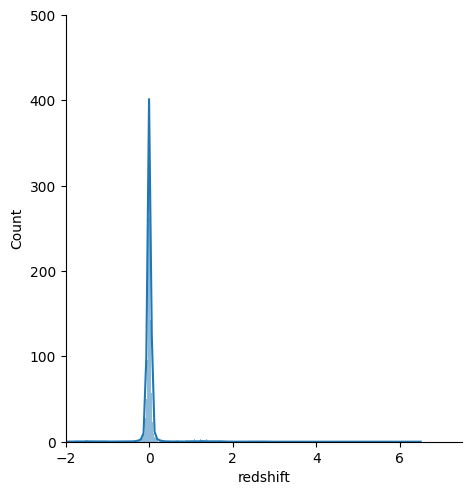

In [25]:
# checking difference between labled y and predicted y
g = sns.displot(data, kind='hist', kde=True)
g.set(ylim=(0, 500), xlim=(-2, 7.5))

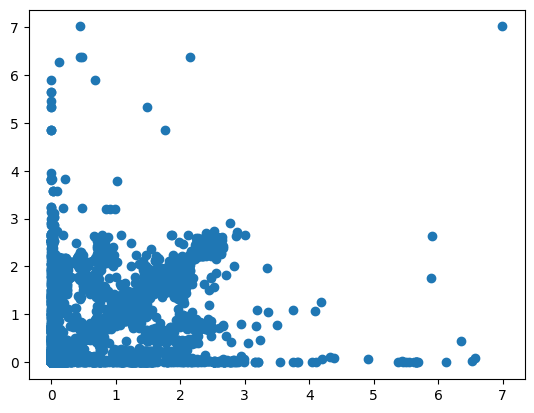

In [26]:
plt.scatter(y_test,y_pred)

In [46]:
tuned_hyper_model= DecisionTreeRegressor(max_depth=10, random_state=144)

In [47]:
# fitting model

tuned_hyper_model.fit(X_train,y_train)

score = tuned_hyper_model.score(X_train, y_train)

# Prediction on the training dataset
y_train_pred = tuned_hyper_model.predict(X_train)

mse = mean_squared_error(y_train, y_train_pred)
mae = mean_absolute_error(y_train, y_train_pred)
evs = explained_variance_score(y_train, y_train_pred)

print(f"R-squared: {score}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")

R-squared: 0.8526908245882127
Mean Absolute Error: 0.05
Mean Squared Error: 0.03
RMSE: 0.0
EVS: 0.85


In [48]:
y_pred = tuned_hyper_model.predict(X_test)

rScore = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print(f"R-squared: {rScore}")
print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")

R-squared: 0.659469767889223
Mean Absolute Error: 0.06
Mean Squared Error: 0.07
RMSE: 0.0
EVS: 0.66


### Plotting prediction errors and residuals using yellowbrick


In [49]:
!pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [50]:
from yellowbrick.regressor import PredictionError

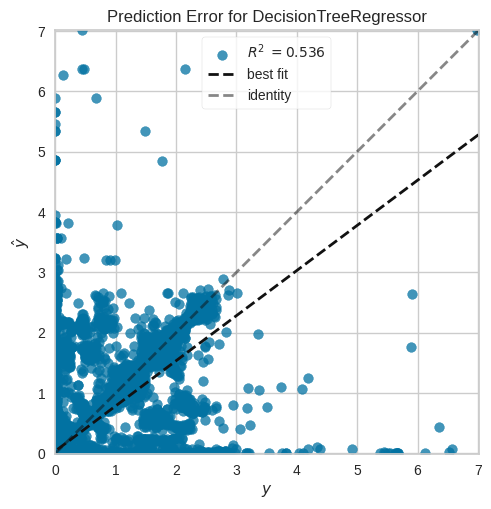

<Axes: title={'center': 'Prediction Error for DecisionTreeRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [51]:
visualizer = PredictionError(dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [52]:
# Residuals plot
from yellowbrick.regressor import ResidualsPlot

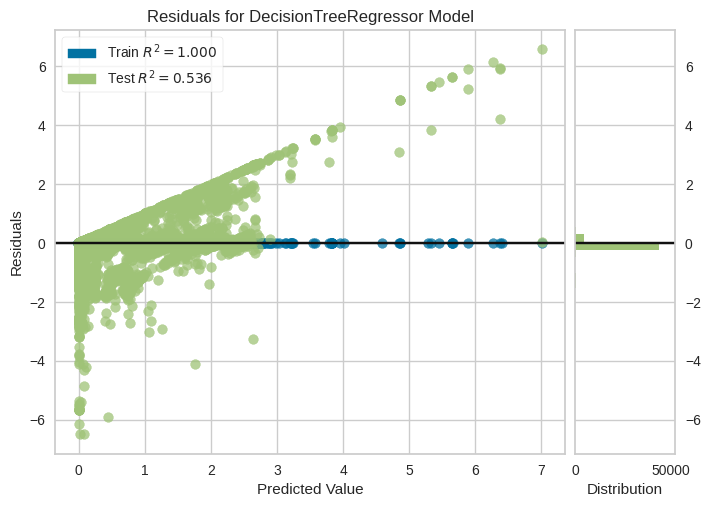

<Axes: title={'center': 'Residuals for DecisionTreeRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [53]:
visualizer = ResidualsPlot(dtr)
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof()

In [54]:
# Testing model evaluation
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
evs = explained_variance_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae.round(2)}")
print(f"Mean Squared Error: {mse.round(2)}")
print(f"RMSE: {np.square(mse).round(2)}")
print(f"EVS: {evs.round(2)}")

Mean Absolute Error: 0.06
Mean Squared Error: 0.07
RMSE: 0.0
EVS: 0.66


### k-fold cross-validation

In [55]:
from sklearn.model_selection import cross_val_score

In [56]:
# Score on training data set
score_train = cross_val_score(dtr, X_train, y_train, scoring='neg_mean_squared_error', cv=20)

In [57]:
score_train

array([-0.08919039, -0.10239159, -0.05430551, -0.0634929 , -0.10511254,
       -0.09705948, -0.06027243, -0.09016369, -0.07081047, -0.0838129 ,
       -0.11853667, -0.09506701, -0.09447551, -0.11359818, -0.07133947,
       -0.08049277, -0.05995324, -0.10752166, -0.10515519, -0.05580053])

In [58]:
score_train = np.absolute(np.mean(score_train)).round(2)
score_train

0.09

In [59]:
# Score on test data set
score_test = cross_val_score(dtr, X_test, y_test, scoring='neg_mean_squared_error', cv=20)

In [60]:
score_test

array([-0.100276  , -0.08164995, -0.07497757, -0.1009379 , -0.07163316,
       -0.08704613, -0.14712663, -0.12461515, -0.07403899, -0.09300501,
       -0.07606839, -0.09091263, -0.08658782, -0.08534284, -0.12569624,
       -0.10306467, -0.07281138, -0.12981816, -0.07473228, -0.07882662])

In [61]:
score_test = np.absolute(np.mean(score_test)).round(3)
score_test

0.094

### Export Machine Learning Model to pickle file to create API

In [62]:
import pickle

In [63]:
pickle.dump(dtr, open('DTRmodel.pkl', 'wb'))

In [64]:
model = pickle.load(open('DTRmodel.pkl', 'rb'))
model.predict(X_test)

array([ 4.161917e-01, -3.257968e-04,  9.867649e-02, ...,  3.434164e-05,
        4.215761e-02,  2.414713e-02])